# This is an invoice dataset I found on kaggle. I thought I would imagine I was working in some kind of compliance/supply chain analyst.  TBML is a technique for criminals and terrorists to move funds through value transfer, under and over-invoicing, hawala networks and other techniques which allows for the disguise of illicit cash flows.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
df = pd.read_csv('1829078.csv')
df.head()

C:\Users\willi\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
0,U001,200769369,DI foundation,18-11-2019 00:00,2019,1930086612,01-11-2019,20191101,20191101,20191116,USD,RV,1,NaN,61426.56,20191101,NAA8,1.930087e+09,0
1,CA02,140105686,SYSC corporation,31-01-2019 00:00,2019,2960522275,15-01-2019,20190115,20190115,20190127,CAD,RV,1,NaN,24563.64,20190117,CA10,2.960522e+09,0
2,U001,200769623,WAL-MAR corp,12-08-2019 00:00,2019,1929673020,30-07-2019,20190729,20190730,20190814,USD,RV,1,NaN,3225.75,20190730,NAH4,1.929673e+09,0
3,U001,200799367,MCL trust,24-06-2019 00:00,2019,1929420801,04-06-2019,20190603,20190604,20190619,USD,RV,1,NaN,67318.35,20190604,NAA8,1.929421e+09,0
4,U001,200776463,KROGE trust,09-08-2019 00:00,2019,1929647073,25-07-2019,20190725,20190725,20190809,USD,RV,1,NaN,43485.58,20190725,NAA8,1.929647e+09,0


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   business_code           50000 non-null  object 
 1   cust_number             50000 non-null  object 
 2   name_customer           50000 non-null  object 
 3   clear_date              46265 non-null  object 
 4   buisness_year           50000 non-null  int64  
 5   doc_id                  50000 non-null  int64  
 6   posting_date            50000 non-null  object 
 7   document_create_date    50000 non-null  int64  
 8   document_create_date.1  50000 non-null  int64  
 9   due_in_date             50000 non-null  int64  
 10  invoice_currency        50000 non-null  object 
 11  document type           50000 non-null  object 
 12  posting_id              50000 non-null  int64  
 13  area_business           0 non-null      float64
 14  total_open_amount       50000 non-null

In [3]:
df['document_create_date'] = pd.to_datetime(df['document_create_date'])
df['document_create_date.1'] = pd.to_datetime(df['document_create_date.1'])
df['due_in_date'] = pd.to_datetime(df['due_in_date'])
df['clear_date'] = pd.to_datetime(df['clear_date'])
df['posting_date'] = pd.to_datetime(df['posting_date'])
df['baseline_create_date']  = pd.to_datetime(df['baseline_create_date'])

## Here I was comparing features with similar names so I could drop like variables.

In [4]:
id_comparisons = df.pivot_table(['doc_id', 'invoice_id', 'posting_id'], index=df.index)

In [5]:
date_comparisons = df[['document_create_date', 'document_create_date.1', 'due_in_date',
               'clear_date','posting_date','baseline_create_date']]

In [6]:
# id_comparisons

In [7]:
## Freq - number of times the top value appears in dataset
# date_comparisons.describe()

In [8]:
df=df.set_index(df['posting_date'])

In [9]:
df = df.drop(['document_create_date','document_create_date.1','due_in_date',
             'invoice_id','posting_id','posting_date','baseline_create_date','area_business'],axis=1)

<AxesSubplot:xlabel='posting_date'>

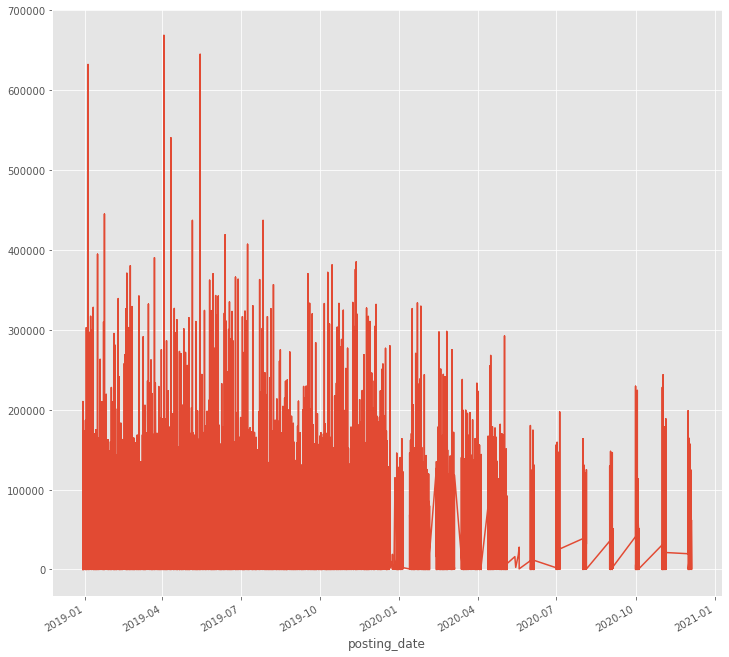

In [10]:
plt.figure(figsize=(12,12))
df['total_open_amount'].plot()

In [21]:
year2020 = df['total_open_amount']['2020-07-01':]

<AxesSubplot:xlabel='posting_date'>

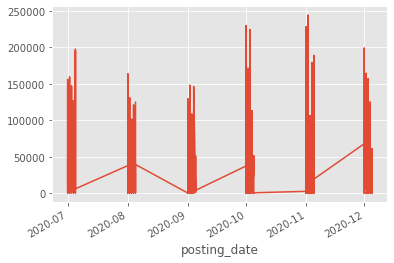

In [22]:
year2020.plot()

In [23]:
year2020['2020-08-15':]

posting_date
2020-12-02     4314.98
2020-10-01    13582.08
2020-12-02     1284.14
2020-10-02    90801.56
2020-12-01    69605.84
                ...   
2020-09-04     1227.21
2020-11-04    35309.92
2020-10-04    63673.35
2020-10-03    48761.64
2020-12-04    26202.77
Name: total_open_amount, Length: 1251, dtype: float64

## I sliced the dataframe and plotted it to avoid the unusual values.  I don't think this dataset was meant to be for fraud analysis. Maybe these can be considered anomalies or a mistake. Maybe this is under-invoicing, attempting to cover up fraud.

<AxesSubplot:xlabel='posting_date'>

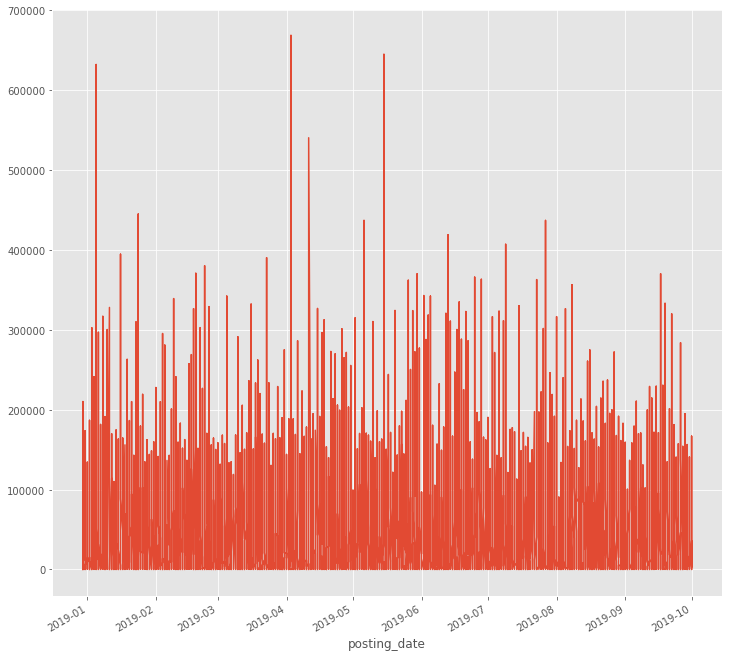

In [73]:
plt.figure(figsize=(12,12))
df['total_open_amount'][:'2019-10-01'].plot()

In [36]:
df['total_amount_av'] = df['total_open_amount'].rolling(30).mean()
df['total_amount_var'] = df['total_open_amount'].rolling(30).std()

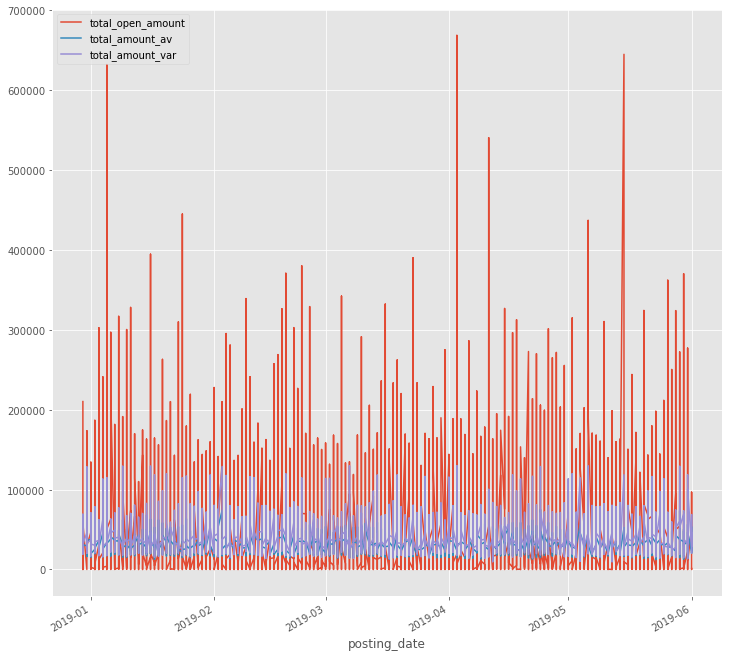

In [37]:
plt.figure(figsize=(12,12))
df['total_open_amount'][:'2019-06-01'].plot()
df['total_amount_av'][:'2019-06-01'].plot()
df['total_amount_var'][:'2019-06-01'].plot()
plt.legend()

<AxesSubplot:xlabel='total_open_amount'>

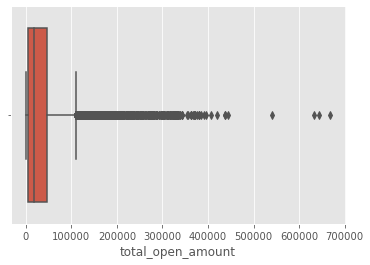

In [38]:
sns.boxplot(df['total_open_amount'])

## It looks like the average of the time series is around 50,000 or lower. Large spikes in the time series could be considered outliers.

In [39]:
df['invoice_currency'].value_counts()

USD    46112
CAD     3888
Name: invoice_currency, dtype: int64

In [40]:
Largest15 = df[df['total_open_amount'] >= 400000]

In [41]:
Largest15.groupby('name_customer')['total_open_amount'].describe().sort_values(by='name_customer',ascending=False)

,count,mean,std,min,25%,50%,75%,max
name_customer,,,,,,,,
SO trust,2.0,422045.555,21109.803211,407118.67,414582.1125,422045.555,429508.9975,436972.44
SO foundation,1.0,436972.430,NaN,436972.43,436972.4300,436972.430,436972.4300,436972.43
SO,1.0,419105.510,NaN,419105.51,419105.5100,419105.510,419105.5100,419105.51
DECA foundation,1.0,444978.600,NaN,444978.60,444978.6000,444978.600,444978.6000,444978.60
CALIFO trust,1.0,540466.980,NaN,540466.98,540466.9800,540466.980,540466.9800,540466.98
CALIFO corporation,1.0,632134.240,NaN,632134.24,632134.2400,632134.240,632134.2400,632134.24
CALIFO co,1.0,644890.820,NaN,644890.82,644890.8200,644890.820,644890.8200,644890.82
CALIFO,1.0,668593.360,NaN,668593.36,668593.3600,668593.360,668593.3600,668593.36


## This is where KYC and EDD policies would come in.  Some of these companies could be front companies because the name are so similar.

<AxesSubplot:xlabel='total_amount_var', ylabel='total_open_amount'>

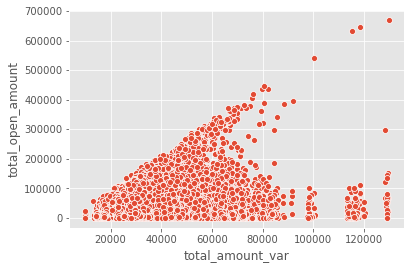

In [42]:
sns.scatterplot('total_amount_var', 'total_open_amount',data=df)

# Clustering

In [43]:
metrics = df[['total_amount_av', 'total_amount_var','total_open_amount']]

In [44]:
metrics = metrics.dropna()

In [45]:
metrics.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49971 entries, 2019-11-15 to 2020-03-18
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   total_amount_av    49971 non-null  float64
 1   total_amount_var   49971 non-null  float64
 2   total_open_amount  49971 non-null  float64
dtypes: float64(3)
memory usage: 1.5 MB


In [46]:
from sklearn.cluster import KMeans
#Assigns data points to the closest centroid using the Euclidean distance
#Euclidean distance - sqrt(x - a)^2 + (y-b)^2
#n_init - Number of time the k-means algorithm will be run with different centroid seeds.
#max_iter - Maximum number of iterations of the k-means algorithm for a single run
km = KMeans(n_init=300, max_iter =200)
preds = km.fit_predict(metrics)
metrics['preds'] = preds

<AxesSubplot:xlabel='total_amount_av', ylabel='total_amount_var'>

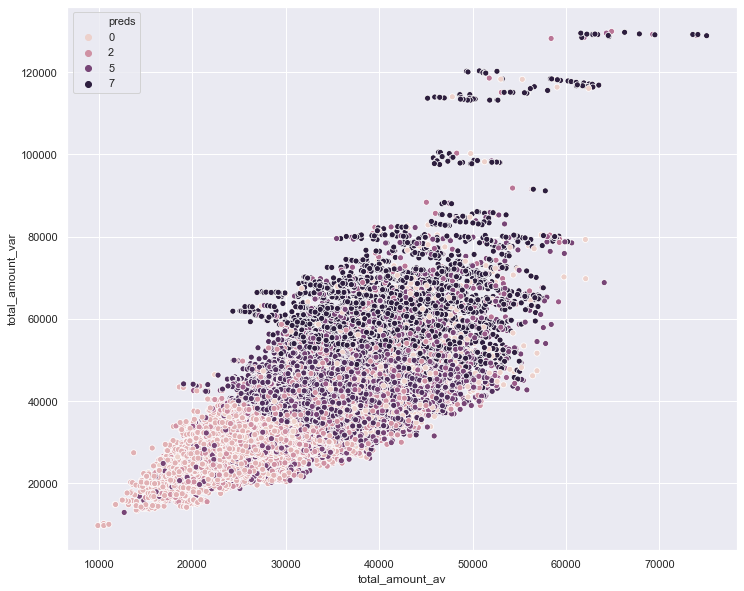

In [47]:
sns.set(rc={'figure.figsize':(12,10)})
sns.scatterplot('total_amount_av', 'total_amount_var', hue=metrics['preds'], data=metrics)

<AxesSubplot:xlabel='total_amount_av', ylabel='total_open_amount'>

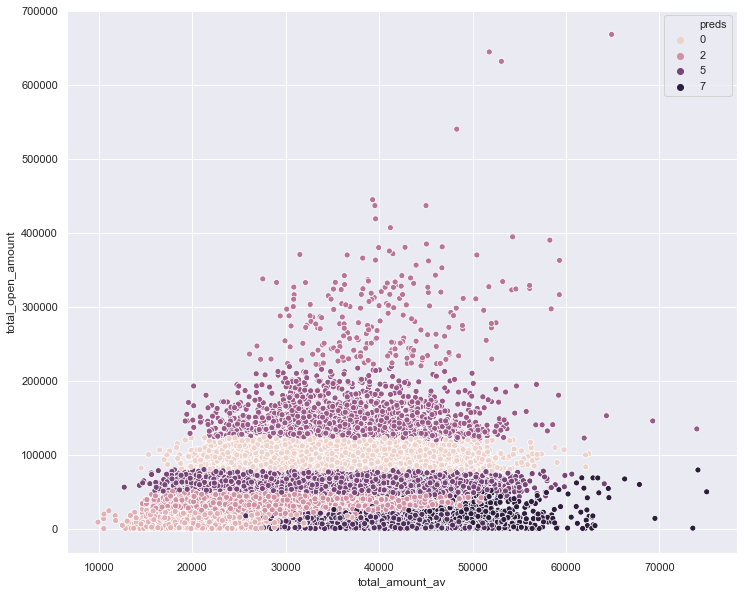

In [48]:
sns.set(rc={'figure.figsize':(12,10)})
sns.scatterplot('total_amount_av', 'total_open_amount', hue=metrics['preds'], data=metrics)

<AxesSubplot:xlabel='total_open_amount', ylabel='total_amount_var'>

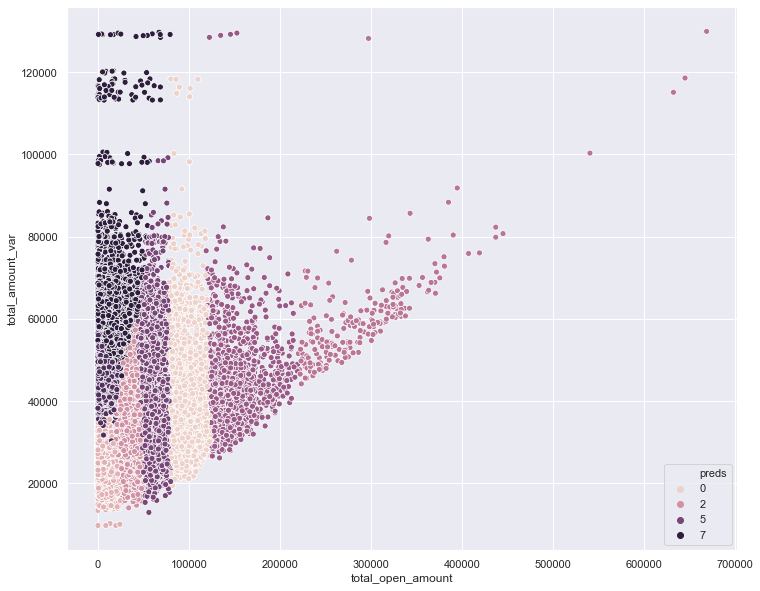

In [49]:
sns.set(rc={'figure.figsize':(12,10)})
sns.scatterplot('total_open_amount', 'total_amount_var', hue=metrics['preds'], data=metrics)

In [50]:
import plotly.express as px
fig = px.scatter_3d(metrics, x='total_amount_av', y='total_amount_var', z='total_open_amount',
              color='preds')
fig.show()

# The data follows a pattern for every cluster, the average and variations rises as the price rises. But there are some outliers in cluster 7, 0,3 and 4 . The price is low but the average and variance are higher.